# *Multi Depth Computer-Generated Holography(CGH)*
`CGH` is an optical technology that mathematically models light diffraction and interference to create holograms. Unlike traditional analog holograms that record interference patterns from real objects, `CGH` calculates the precise `diffraction patterns` needed to reconstruct a desired image when illuminated.   

We are going to reconstruct the light field using the `forward` function of the `pado` . For the distance propagated through the forward, we will reconstruct the light field by moving back in the `opposite direction`.

In [1]:
cd ../..

c:\Users\PC\Desktop\pado-internal


---

## 🌊 **Step 1: Import Pado**
First, you should import `Pado`. Make sure to install all the dependency.

In [2]:
import pado
from pado.math import cm, nm, um   # Use units of cm, nm, and um for readability.
import torch

## ⚙️ **Step 2: Default value setting**
Sets the values of the variables used in the code. You can change the values in this part to suit your situation.

In [3]:
R = 2000  # number of rows
C = 2000  # number of columns
pitch = 7.2*um  # physical size of each pixel in [m]
wvl = [660*nm, 521*nm, 445*nm] # wavelength of the light in [m]
dim = (1, 3, R, C)  # dimension of the light [batch, channel, row, column]
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# By default, we use the ASM method. 
# If you want to use a different propagate method, you can choose the option of Fraunhofer, Fresnel, FFT (Fast Fourier Transform), ASM, and RS.
prop = pado.propagator.Propagator('ASM') 

d1 = 50 * cm # distance from the CGH plane to the first image plane
d2 = 60 * cm # distance from the CGH plane to the second image plane

## 🖼️ **Step 3: Load image to light**
Load the desired image into light. Also, combine several images to make one light field.

First plane (PADO_letter.PNG)


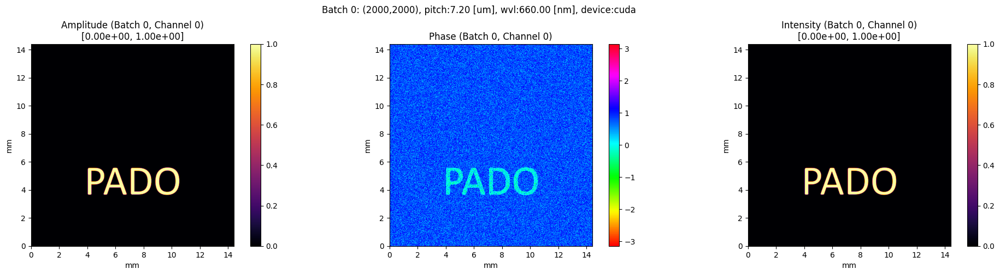

Second plane (PADO_logo.PNG)


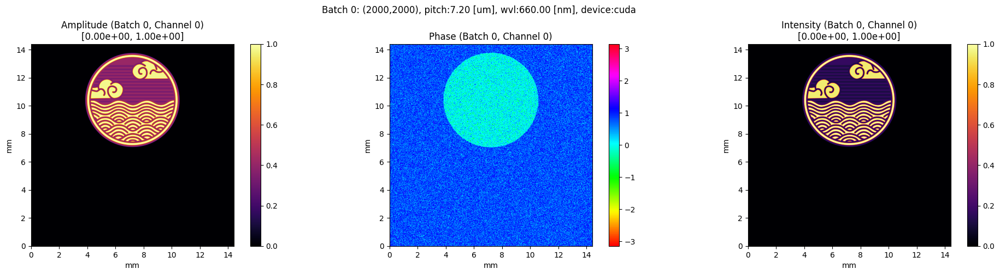

combine_image


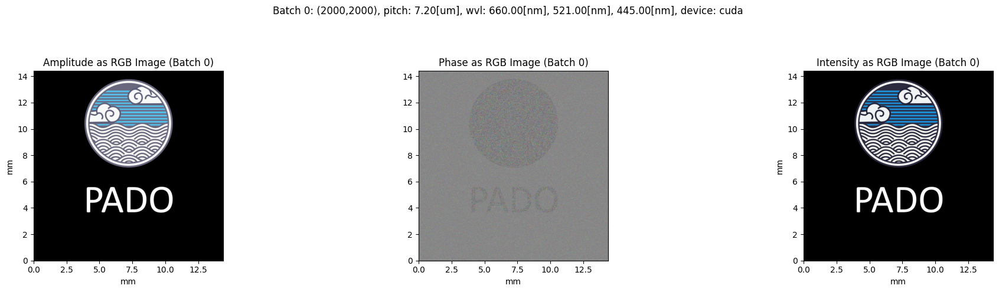

In [4]:
# create a light object and load an image
first_plane = pado.light.Light(dim,pitch,wvl,device=device)
first_plane.load_image(image_path=r'example\asset\PADO_letter.PNG', random_phase=True) # load an image with random phase
print("First plane (PADO_letter.PNG)")
first_plane.visualize(c=0) # visualize the first image plane in the first channel
# If you want to see another channel, you can change the value of parameter c.

second_plane = pado.light.Light(dim,pitch,wvl,device=device)
second_plane.load_image(image_path=r'example\asset\PADO_logo.png', random_phase=True)
print("Second plane (PADO_logo.PNG)")
second_plane.visualize(c=0) # visualize the second image plane in the first channel

# combine the two light fields
combine_image = pado.light.Light(dim,pitch,wvl,device=device)
combine_image.set_field(first_plane.get_field() + second_plane.get_field()) # In this way, you can combine 2 light fields
print("combine_image")
combine_image.visualize_image() # visualize the combined image in all channels

## 🔜 **Step 4: Propagate light field**
Now let's propagate `light` fields using `forward` method into SLM plane.

Propagation of the first plane to slm plane


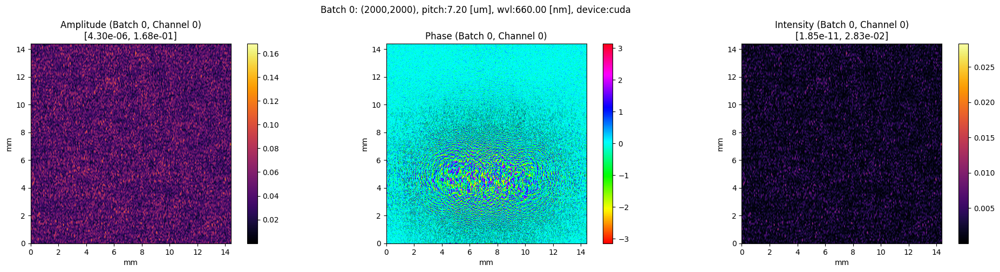

Propagation of the second plane to slm plane


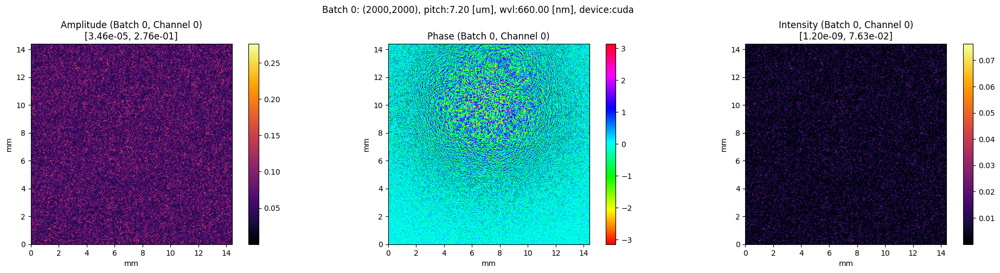

In [5]:
first_plane_after_propagation = prop.forward(first_plane, d1) #Let's use the propagator's forward function to propagate the light field.
print('Propagation of the first plane to slm plane')
first_plane_after_propagation.visualize(c=0) # in the first channel

second_plane_after_propagation = prop.forward(second_plane, d2)
print('Propagation of the second plane to slm plane')
second_plane_after_propagation.visualize(c=0) # in the first channel

## 🔙 **Step 5: Reconstruct light field**
Let's `reconstruct` images through `backward` wave propagation as the diffracted light waves interfere in precisely controlled spatial patterns.

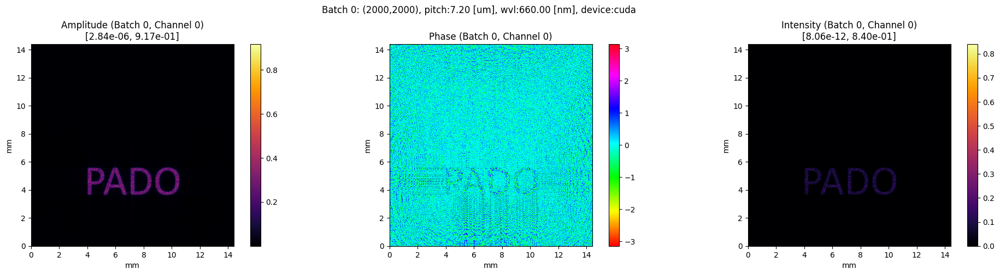

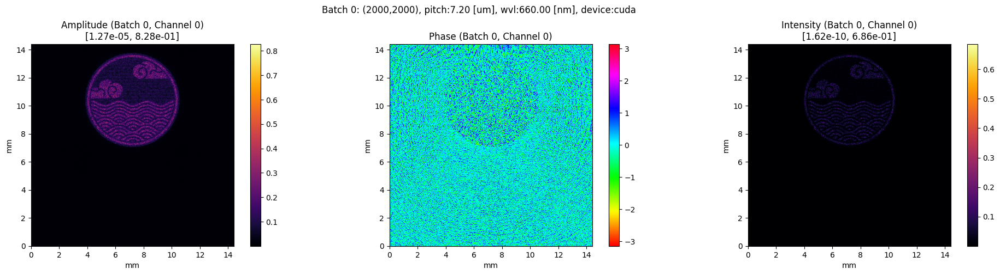

In [6]:
first_plane_recon =  prop.forward(first_plane_after_propagation, -d1) # Restore by propagating the distance as opposed to the propagated distance.
first_plane_recon.visualize(c=0) 

second_plane_recon =  prop.forward(second_plane_after_propagation, -d2)
second_plane_recon.visualize(c=0) 

## ⚡ **Step 6 : Combine propagated lights**
`CGH` leverages the `superposition` principle of diffraction optics, allowing different holographic patterns to be combined by summing their `complex fields`, which physically corresponds to the overlapping of their diffracted light waves in space.

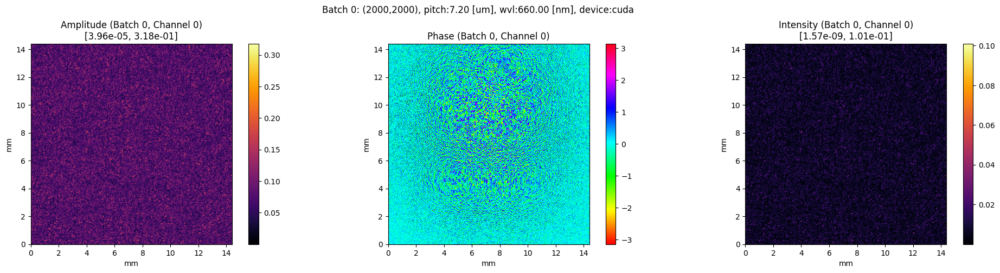

In [7]:
combined_light = pado.light.Light(dim,pitch,wvl,device=device)
combined_light.set_field(first_plane_after_propagation.get_field() + second_plane_after_propagation.get_field()) # It is also possible to combine the 2 light fields proposed in this way.
combined_light.visualize(c=0) # in the first channel

## 🎨 **Step 7: Reconstruct image at each depth**
`Reconstruct` the image from the combined `CGH` planes at each depth.   
For each plane, proceed again by a negative value of the distance propagated. (That is, it is equivalent to returning to the origin.)

For depth d1


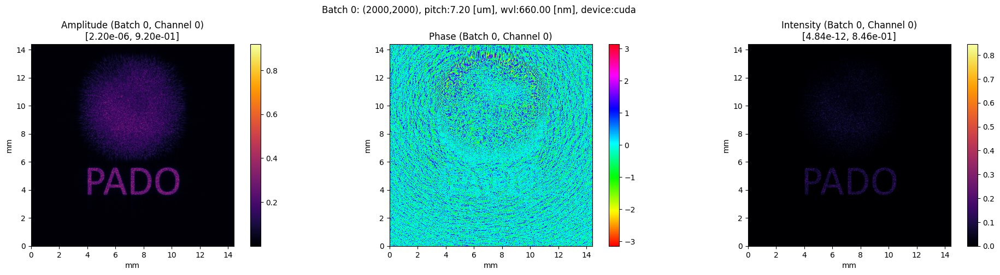

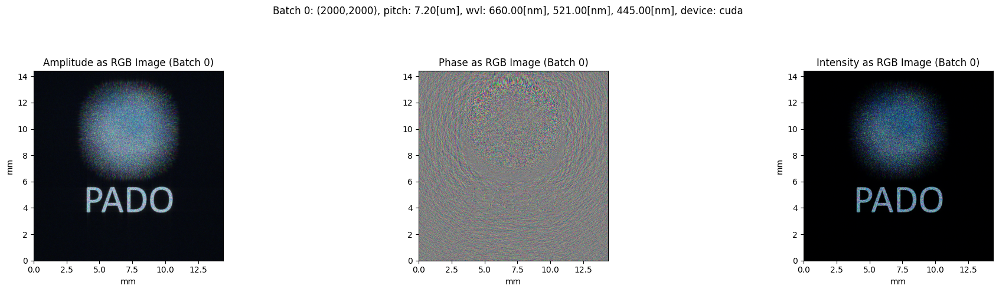

For depth d2


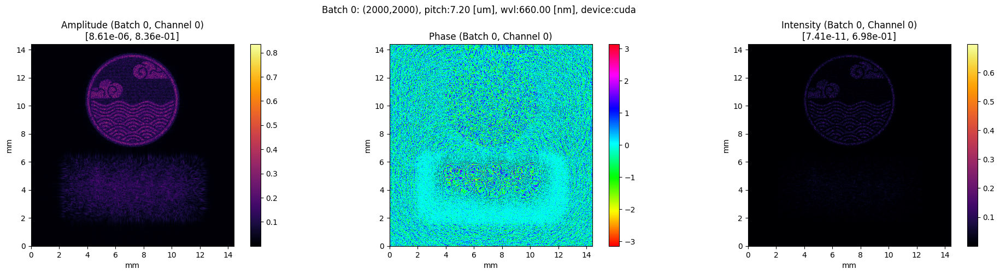

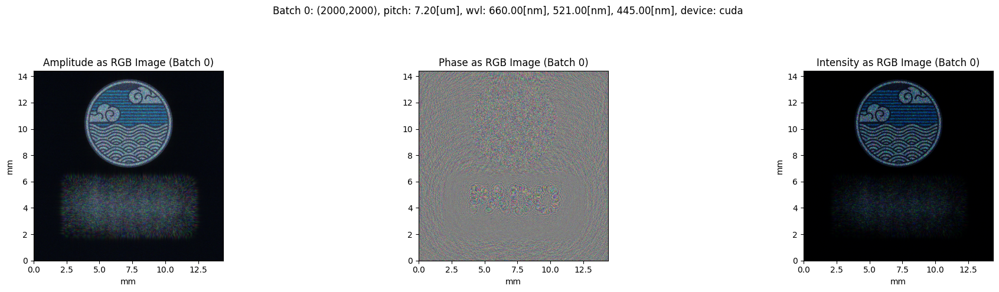

In [8]:
print("For depth d1")
reconstructed_light_d1 = prop.forward(combined_light, -d1) # Propagate by the first depth, -d1.
reconstructed_light_d1.visualize(c=0) # in the first channel

reconstructed_light_d1.adjust_amplitude_to_other_light(combine_image)
reconstructed_light_d1.visualize_image() # You can observe only PADO_letter(Firstplane) is clear.

print("For depth d2")
reconstructed_light_d2 = prop.forward(combined_light, -d2)
reconstructed_light_d2.visualize(c=0) # in the first channel

reconstructed_light_d2.adjust_amplitude_to_other_light(combine_image)
reconstructed_light_d2.visualize_image() # You can observe only PADO_logo(Secondplane) is clear.